# Customer churn is when a company’s customers stop doing business with that company. Businesses are very keen on measuring churn because keeping an existing customer is far less expensive than acquiring a new customer. New business involves working leads through a sales funnel, using marketing and sales budgets to gain additional customers. Existing customers will often have a higher volume of service consumption and can generate additional customer referrals.

# Customer retention can be achieved with good customer service and products. But the most effective way for a company to prevent attrition of customers is to truly know them. The vast volumes of data collected about customers can be used to build churn prediction models.

# This is a classification problem.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
import warnings
warnings.filterwarnings('ignore')

In [2]:
data=pd.read_csv('Telecom_churn.csv')

In [3]:
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [4]:
df=pd.DataFrame(data)

In [5]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [6]:
df.shape

(7043, 21)

There are 7043 records and 21 features.

The target(output) feature is churn.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


The features are having mixed datatype i.e object,integer and float.

In [8]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

There are no null values present in the dataset.

<AxesSubplot:>

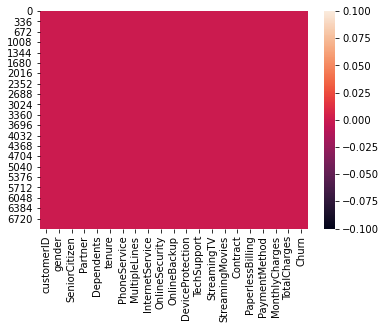

In [9]:
sns.heatmap(df.isnull())

In [10]:
df['gender'].unique()

array(['Female', 'Male'], dtype=object)

In [11]:
df['gender'].value_counts()

Male      3555
Female    3488
Name: gender, dtype: int64

There are 3555 records for male and 3488 records for female.

<AxesSubplot:xlabel='gender', ylabel='count'>

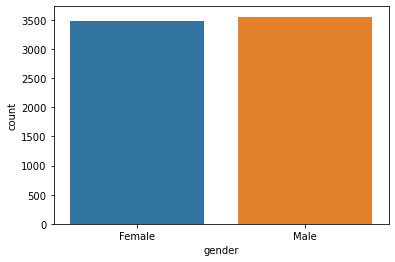

In [12]:
sns.countplot(x='gender',data=df)

<AxesSubplot:xlabel='gender', ylabel='count'>

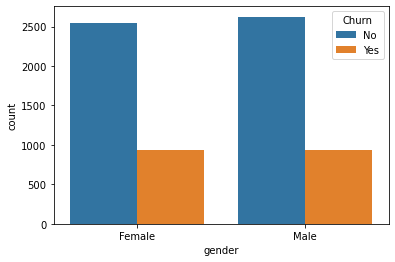

In [13]:
sns.countplot(x='gender',hue='Churn',data=df)

In [14]:
df.groupby('Churn')['gender'].value_counts()

Churn  gender
No     Male      2625
       Female    2549
Yes    Female     939
       Male       930
Name: gender, dtype: int64

In [15]:
Yes_churn_female=(939/3488)*100

In [16]:
Yes_churn_female

26.920871559633024

27% of the female customer are churned and 73% of them are retained.

In [17]:
Yes_churn_male=(930/3555)*100

In [18]:
Yes_churn_male

26.160337552742618

26% of the male customer are churned and 74% of them are retained.

The retain percentage is higher among male customer as compared to female.

In [19]:
df['SeniorCitizen'].value_counts()

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

In [20]:
Yes_Senior_citizen=(1142/(len(df)))*100

In [21]:
Yes_Senior_citizen

16.21468124378816

Out of total 7043 customers,1142(16%)of the customers who are senior citizens.Thus most of our customers in the data are younger people.

<AxesSubplot:xlabel='SeniorCitizen', ylabel='count'>

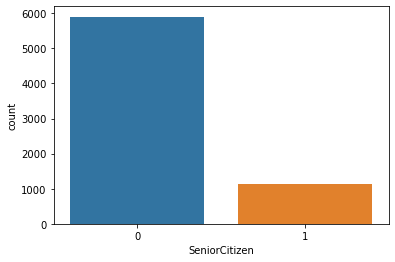

In [22]:
sns.countplot(x='SeniorCitizen',data=df)

<AxesSubplot:xlabel='SeniorCitizen', ylabel='count'>

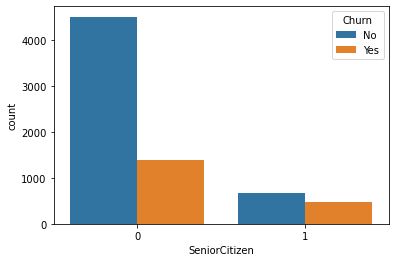

In [23]:
sns.countplot(x='SeniorCitizen',hue='Churn',data=df)

In [24]:
df[df['SeniorCitizen']==1]['SeniorCitizen'].value_counts()

1    1142
Name: SeniorCitizen, dtype: int64

In [25]:
df.groupby('Churn')['SeniorCitizen'].value_counts()

Churn  SeniorCitizen
No     0                4508
       1                 666
Yes    0                1393
       1                 476
Name: SeniorCitizen, dtype: int64

In [26]:
Yes_churn_senior=476/1142

In [27]:
Yes_churn_senior

0.4168126094570928

42% of the SeniorCitizen are churned and 58 % are retained.

In [28]:
df['Partner'].value_counts()

No     3641
Yes    3402
Name: Partner, dtype: int64

<AxesSubplot:xlabel='Partner', ylabel='count'>

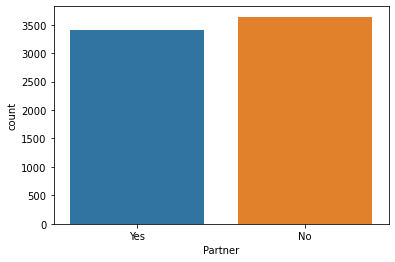

In [29]:
sns.countplot(x='Partner',data=df)

In [30]:
Yes_partner=(3402/(len(df)))*100

In [31]:
Yes_partner

48.30327985233565

48% of the customers have a partner.

<AxesSubplot:xlabel='Partner', ylabel='count'>

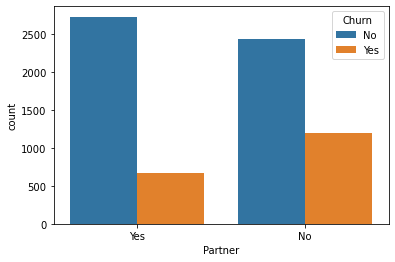

In [32]:
sns.countplot(x='Partner',hue='Churn',data=df)

In [33]:
df.groupby('Churn')['Partner'].value_counts()

Churn  Partner
No     Yes        2733
       No         2441
Yes    No         1200
       Yes         669
Name: Partner, dtype: int64

In [34]:
yes_churn_partner=699/3402

In [35]:
yes_churn_partner

0.2054673721340388

21% of the customers who are having partner are churned and 79% are retained.

In [36]:
df['Dependents'].value_counts()

No     4933
Yes    2110
Name: Dependents, dtype: int64

In [37]:
Yes_Dependents=(2110/len(df))*100

In [38]:
Yes_Dependents

29.95882436461735

30% of the customers have dependents.

<AxesSubplot:xlabel='Dependents', ylabel='count'>

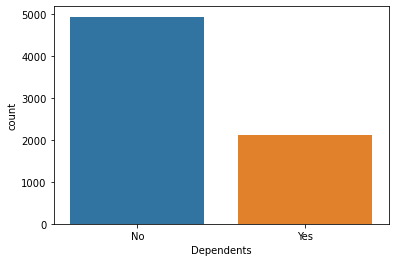

In [39]:
sns.countplot(x='Dependents',data=df)

In [40]:
df.groupby('Churn')['Dependents'].value_counts()

Churn  Dependents
No     No            3390
       Yes           1784
Yes    No            1543
       Yes            326
Name: Dependents, dtype: int64

In [41]:
yes_churn_dependents=326/2110

In [42]:
yes_churn_dependents

0.15450236966824646

15% of the customers having dependents are churned and 85% are retained.

Text(0.5, 1.0, '# of Customers by their tenure')

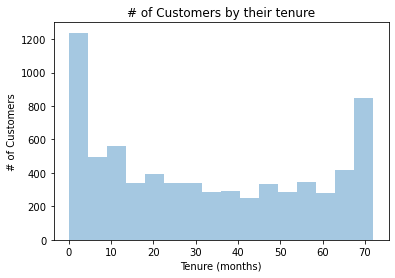

In [43]:
sns.distplot(df['tenure'], hist=True, kde=False,)
plt.ylabel('# of Customers')
plt.xlabel('Tenure (months)')
plt.title('# of Customers by their tenure')

After looking at the  histogram we can see that a lot of customers have been with the telecom company for just a month, while quite a many are there for about 72 months.

In [44]:
df['PhoneService'].value_counts()

Yes    6361
No      682
Name: PhoneService, dtype: int64

<AxesSubplot:xlabel='PhoneService', ylabel='count'>

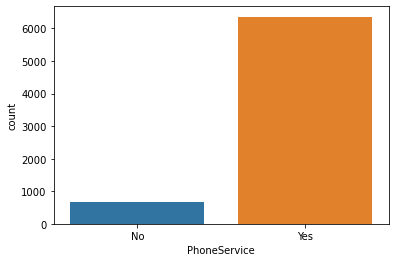

In [45]:
sns.countplot(df['PhoneService'])

There are 6361(90%) customers with phone service.

In [46]:
df.groupby('Churn')['PhoneService'].value_counts()

Churn  PhoneService
No     Yes             4662
       No               512
Yes    Yes             1699
       No               170
Name: PhoneService, dtype: int64

In [47]:
Yes_churn_phoneservice=(1699/6361)*100

In [48]:
Yes_churn_phoneservice

26.70963684955196

27% of the customers with PhoneService are churned and 73% are retained.

In [49]:
df['MultipleLines'].value_counts()

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64

<AxesSubplot:xlabel='MultipleLines', ylabel='count'>

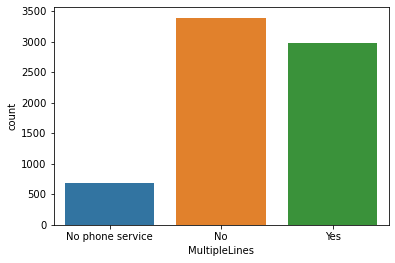

In [50]:
sns.countplot(df['MultipleLines'])

There are 42% customers having multipleLines.

In [51]:
df2=df.copy()

In [52]:
pd.set_option('display.max_rows',None)
df2['TotalCharges'].value_counts()
df2['TotalCharges']=df2['TotalCharges'].replace(" ",'0')

There are total 11 records where no monthly charges are there so i am replacing the same with zero instead of dropping them.

In [53]:
df2['TotalCharges']=pd.to_numeric(df2['TotalCharges'])


In [54]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


Have converted the totalCharges having object datatype into float.

In [55]:
numeric_features = df2.select_dtypes(include=[np.number])
numeric_features.columns

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

In [56]:
categorical_features  = df2.select_dtypes(include=[np.object])
categorical_features.columns

Index(['customerID', 'gender', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

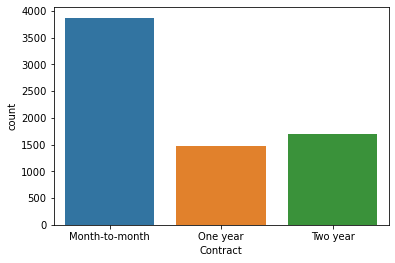

In [57]:
sns.countplot(x='Contract', data=df2)
plt.show()

Most customers have a Month-to-month contract.

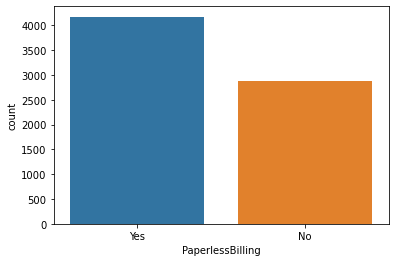

In [58]:
sns.countplot(x='PaperlessBilling', data=df2)
plt.show()

A lot of customers have a paperless billing.

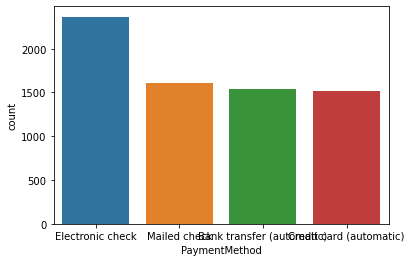

In [59]:
sns.countplot(x='PaymentMethod', data=df2)
plt.show()

In [60]:
df2['PaymentMethod'].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

The most of the customer are using Electronic check as the mode of PaymentMethod.

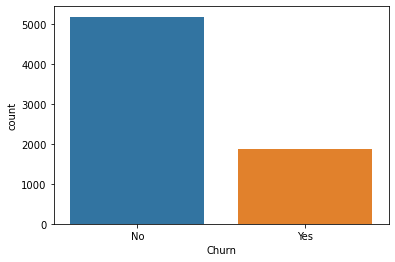

In [61]:
sns.countplot(x='Churn', data=df2)
plt.show()

In [62]:
df2['Churn'].value_counts()

No     5174
Yes    1869
Name: Churn, dtype: int64

Out of the total records of 7043, 73% of the records are for the customers retained and 27% records are for the customers churned out.

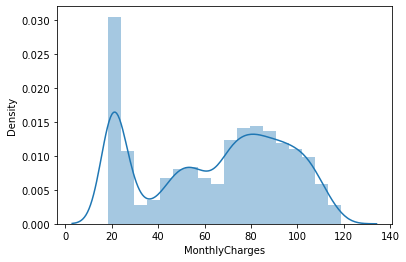

In [63]:
sns.distplot(df2['MonthlyCharges'])
plt.show()

A lot of customers have minimum monthly charges because they choose the cheapest offer among all.

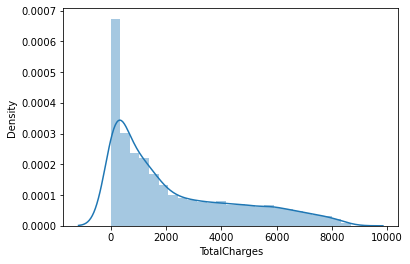

In [64]:
sns.distplot(df2['TotalCharges'])
plt.show()

A lot of customers have minimum Total charges because they choose the cheapest offer having less monthly charges so that the overall total charges will come down.

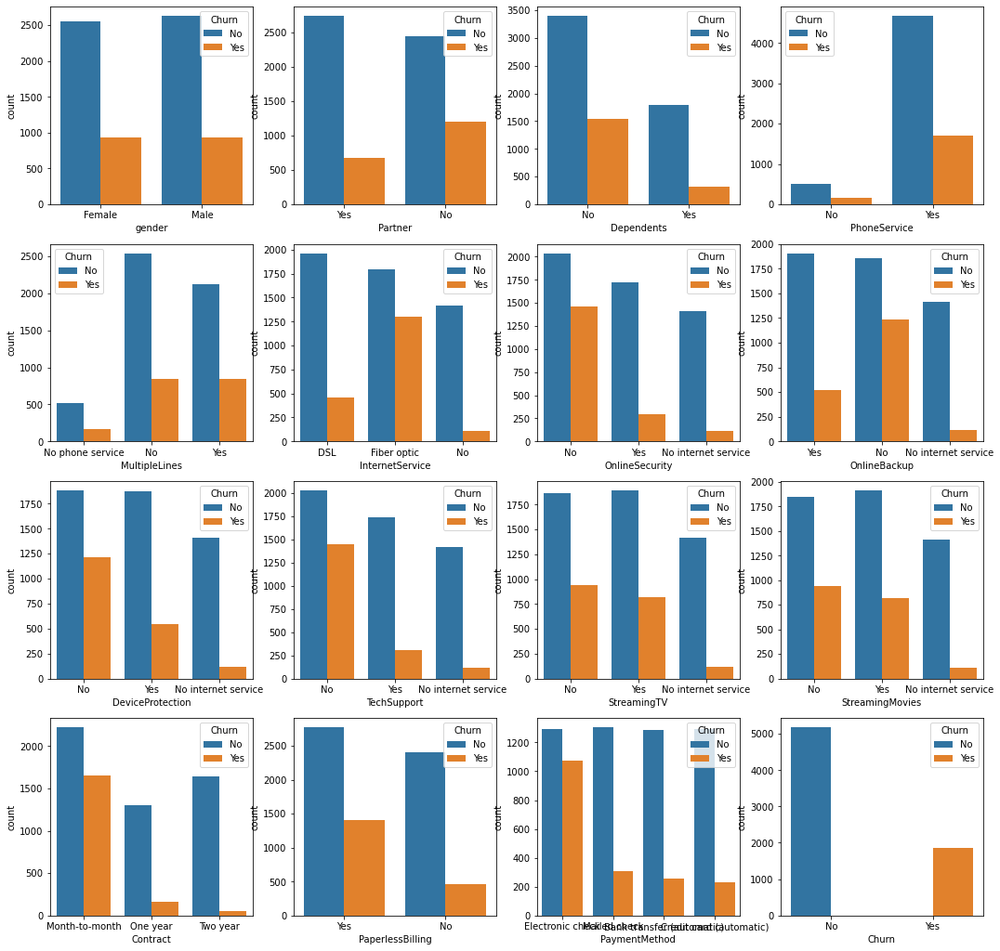

In [65]:
plt.figure(figsize=(18, 18))

for k in range(1, len(categorical_features.columns)):
    plt.subplot(4, 4, k)
    sns.countplot(x=categorical_features.columns[k], data=df2, hue='Churn')

Those who have a month-to-month contract are more likely to churn.
Those who have fibre optic internet service are more likely to churn.
Those who have no technical support, no Online backup, no online Security are most likely to churn.

<AxesSubplot:xlabel='MonthlyCharges', ylabel='TotalCharges'>

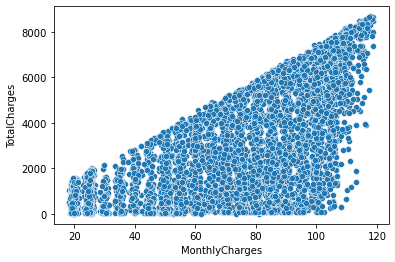

In [66]:
sns.scatterplot(x='MonthlyCharges',y='TotalCharges',data=df2)

As the monthly charges increases the TotalCharges will also increase there is a linear positive correaltion between them.

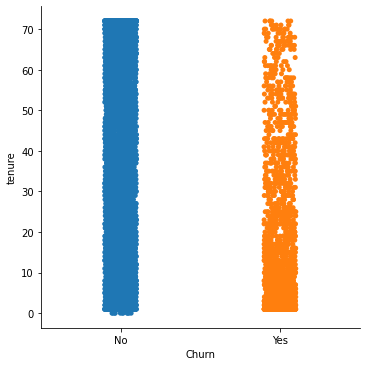

In [67]:
sns.catplot(x='Churn',y='tenure',data=df2)

For those who stayed i.e retained, the distribution is fairly homogeneous.

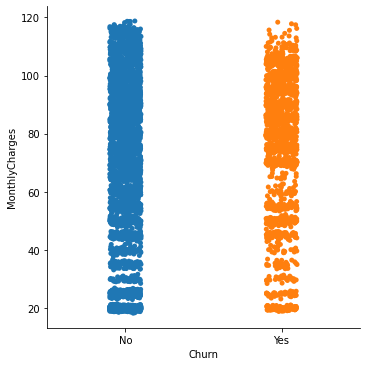

In [68]:
sns.catplot(x='Churn', y='MonthlyCharges', data=df2)
plt.show()

Those who have churned out many had high monthlycharges>70.

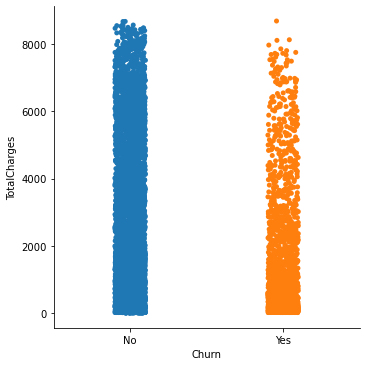

In [69]:
sns.catplot(x='Churn', y='TotalCharges', data=df2)
plt.show()

The overall charge for those who have churned is low in general, because they tend to stay for a short time.

In [70]:
df2.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692,2279.734304
std,0.368612,24.559481,30.090047,2266.794470
min,0.000000,0.000000,18.250000,0.000000
25%,0.000000,9.000000,35.500000,398.550000
50%,0.000000,29.000000,70.350000,1394.550000
75%,0.000000,55.000000,89.850000,3786.600000
max,1.000000,72.000000,118.750000,8684.800000


for tenure i.e 25% of the records are having less than 9 months tenure.
For tenure i.e 50% of the records are having less than 29 months tenure.
for tenure i.e 75% of the records are having less than 55 months tenure.

The features tenure and TotalCharges are having right tailed skewness as mean is greater than median.
The feature MonthlyCharges is having left tailed skewness as mean is less than median.

SeniorCitizen        AxesSubplot(0.125,0.657941;0.227941x0.222059)
tenure            AxesSubplot(0.398529,0.657941;0.227941x0.222059)
MonthlyCharges    AxesSubplot(0.672059,0.657941;0.227941x0.222059)
TotalCharges         AxesSubplot(0.125,0.391471;0.227941x0.222059)
dtype: object

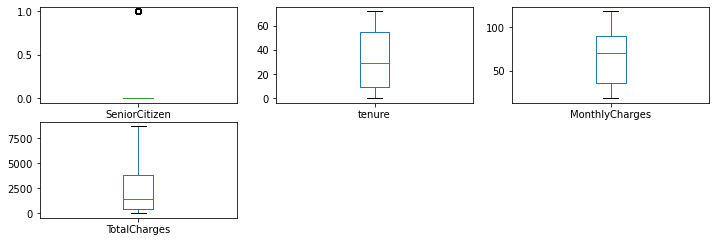

In [71]:
df2.plot(kind='box',figsize=[12,6],layout=[3,3],subplots=True)

There are no outliers present in the dataset.

In [72]:
df2.skew()

SeniorCitizen     1.833633
tenure            0.239540
MonthlyCharges   -0.220524
TotalCharges      0.963235
dtype: float64

In [73]:
df3=df2.copy()

Removing skewness from Total Charges.

In [74]:
from sklearn.preprocessing import power_transform

In [75]:
df3['TotalCharges']=power_transform(df3['TotalCharges'].values.reshape(-1,1))

In [76]:
df3.skew()

SeniorCitizen     1.833633
tenure            0.239540
MonthlyCharges   -0.220524
TotalCharges     -0.146121
dtype: float64

Applying LabelEncoder on the Categorical Dataset.

In [77]:
from sklearn.preprocessing import LabelEncoder

In [78]:
for i in categorical_features.columns:
    le=LabelEncoder()
    df3[i]=le.fit_transform(df3[i])

In [79]:
df3

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,5375,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,1,2,29.85,-1.792996,0
1,3962,1,0,0,0,34,1,0,0,2,...,2,0,0,0,1,0,3,56.95,0.254809,0
2,2564,1,0,0,0,2,1,0,0,2,...,0,0,0,0,0,1,3,53.85,-1.375173,1
3,5535,1,0,0,0,45,0,1,0,2,...,2,2,0,0,1,0,0,42.30,0.233807,0
4,6511,0,0,0,0,2,1,0,1,0,...,0,0,0,0,0,1,2,70.70,-1.239490,1
5,6551,0,0,0,0,8,1,2,1,0,...,2,0,2,2,0,1,2,99.65,-0.350280,1
6,1002,1,0,0,1,22,1,2,1,0,...,0,0,2,0,0,1,1,89.10,0.280071,0
7,4770,0,0,0,0,10,0,1,0,2,...,0,0,0,0,0,0,3,29.75,-0.923101,0
8,5604,0,0,1,0,28,1,2,1,0,...,2,2,2,2,0,1,2,104.80,0.664459,1
9,4534,1,0,0,1,62,1,0,0,2,...,0,0,0,0,1,0,0,56.15,0.790141,0


In [80]:
df3.drop('customerID',axis=1,inplace=True)

In [81]:
df3

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,1,0,0,2,0,0,0,0,0,1,2,29.85,-1.792996,0
1,1,0,0,0,34,1,0,0,2,0,2,0,0,0,1,0,3,56.95,0.254809,0
2,1,0,0,0,2,1,0,0,2,2,0,0,0,0,0,1,3,53.85,-1.375173,1
3,1,0,0,0,45,0,1,0,2,0,2,2,0,0,1,0,0,42.30,0.233807,0
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,-1.239490,1
5,0,0,0,0,8,1,2,1,0,0,2,0,2,2,0,1,2,99.65,-0.350280,1
6,1,0,0,1,22,1,2,1,0,2,0,0,2,0,0,1,1,89.10,0.280071,0
7,0,0,0,0,10,0,1,0,2,0,0,0,0,0,0,0,3,29.75,-0.923101,0
8,0,0,1,0,28,1,2,1,0,0,2,2,2,2,0,1,2,104.80,0.664459,1
9,1,0,0,1,62,1,0,0,2,2,0,0,0,0,1,0,0,56.15,0.790141,0


In [82]:
corr=df3.corr()

In [83]:
corr['Churn'].sort_values(ascending=False)

Churn               1.000000
MonthlyCharges      0.193356
PaperlessBilling    0.191825
SeniorCitizen       0.150889
PaymentMethod       0.107062
MultipleLines       0.038037
PhoneService        0.011942
gender             -0.008612
StreamingTV        -0.036581
StreamingMovies    -0.038492
InternetService    -0.047291
Partner            -0.150448
Dependents         -0.164221
DeviceProtection   -0.178134
OnlineBackup       -0.195525
TotalCharges       -0.233239
TechSupport        -0.282492
OnlineSecurity     -0.289309
tenure             -0.352229
Contract           -0.396713
Name: Churn, dtype: float64

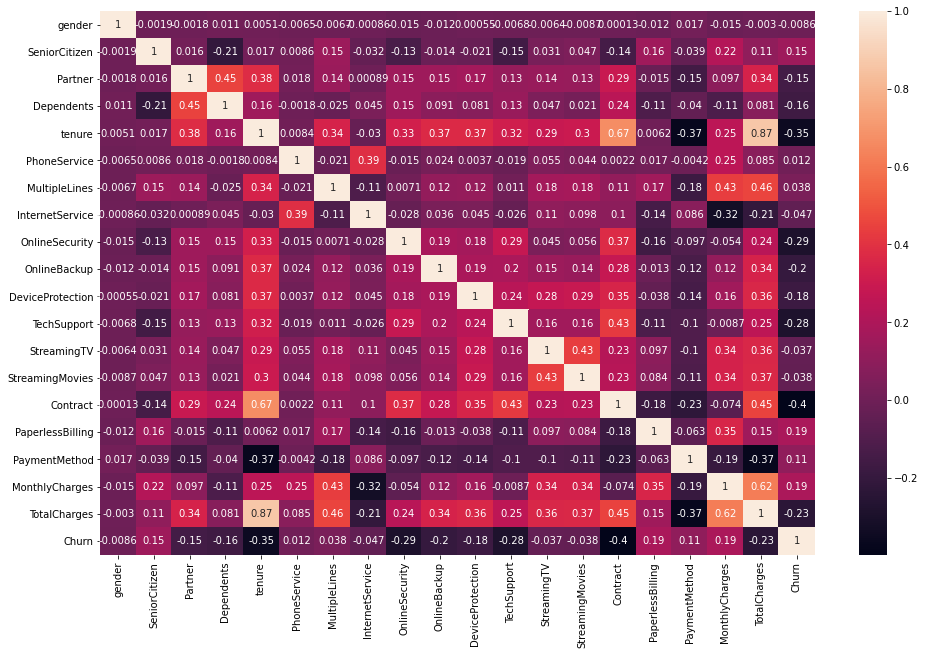

In [84]:
plt.figure(figsize=[16,10])
sns.heatmap(df3.corr(),annot=True)
plt.show()

There is a negative correlation of churn with tenure and TotalCharges.

In [85]:
x=df3.drop('Churn',axis=1)
y=df3['Churn']

In [86]:
se=StandardScaler()
x=se.fit_transform(x)


In [87]:
from sklearn.model_selection import train_test_split

In [92]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)
from sklearn.linear_model import LogisticRegression

In [93]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred=lr.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.8147622427253371
[[937  99]
 [162 211]]
              precision    recall  f1-score   support

           0       0.85      0.90      0.88      1036
           1       0.68      0.57      0.62       373

    accuracy                           0.81      1409
   macro avg       0.77      0.74      0.75      1409
weighted avg       0.81      0.81      0.81      1409



In [94]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred1=dtc.predict(x_test)
print(accuracy_score(y_test,pred1))
print(confusion_matrix(y_test,pred1))
print(classification_report(y_test,pred1))

0.723207948899929
[[832 204]
 [186 187]]
              precision    recall  f1-score   support

           0       0.82      0.80      0.81      1036
           1       0.48      0.50      0.49       373

    accuracy                           0.72      1409
   macro avg       0.65      0.65      0.65      1409
weighted avg       0.73      0.72      0.73      1409



In [105]:
svc=SVC()
svc.fit(x_train,y_train)
pred2=svc.predict(x_test)
print(accuracy_score(y_test,pred2))
print(confusion_matrix(y_test,pred2))
print(classification_report(y_test,pred2))


0.8034066713981547
[[950  86]
 [191 182]]
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      1036
           1       0.68      0.49      0.57       373

    accuracy                           0.80      1409
   macro avg       0.76      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [95]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
pred3=knn.predict(x_test)
print(accuracy_score(y_test,pred3))
print(confusion_matrix(y_test,pred3))
print(classification_report(y_test,pred3))

0.7608232789212207
[[885 151]
 [186 187]]
              precision    recall  f1-score   support

           0       0.83      0.85      0.84      1036
           1       0.55      0.50      0.53       373

    accuracy                           0.76      1409
   macro avg       0.69      0.68      0.68      1409
weighted avg       0.75      0.76      0.76      1409



In [96]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
pred4=rfc.predict(x_test)
print(accuracy_score(y_test,pred4))
print(confusion_matrix(y_test,pred4))
print(classification_report(y_test,pred4))

0.794889992902768
[[944  92]
 [197 176]]
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1036
           1       0.66      0.47      0.55       373

    accuracy                           0.79      1409
   macro avg       0.74      0.69      0.71      1409
weighted avg       0.78      0.79      0.78      1409



In [97]:
ada=AdaBoostClassifier()
ada.fit(x_train,y_train)
pred5=ada.predict(x_test)
print(accuracy_score(y_test,pred5))
print(confusion_matrix(y_test,pred5))
print(classification_report(y_test,pred5))

0.8026969481902059
[[931 105]
 [173 200]]
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1036
           1       0.66      0.54      0.59       373

    accuracy                           0.80      1409
   macro avg       0.75      0.72      0.73      1409
weighted avg       0.79      0.80      0.80      1409



In [98]:
gr=GradientBoostingClassifier()
gr.fit(x_train,y_train)
pred6=gr.predict(x_test)
print(accuracy_score(y_test,pred6))
print(confusion_matrix(y_test,pred6))
print(classification_report(y_test,pred6))

0.8090844570617459
[[941  95]
 [174 199]]
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1036
           1       0.68      0.53      0.60       373

    accuracy                           0.81      1409
   macro avg       0.76      0.72      0.74      1409
weighted avg       0.80      0.81      0.80      1409



# Checking out the cross_val_score

In [100]:
from sklearn.model_selection import cross_val_score

In [101]:
score=cross_val_score(lr,x,y,cv=5)
print(score.mean())

0.8061907219820632


In [102]:
score1=cross_val_score(dtc,x,y,cv=5)
print(score1.mean())

0.7268189681592361


In [106]:
score2=cross_val_score(svc,x,y,cv=5)
print(score2.mean())

0.7990932882766629


In [107]:
score3=cross_val_score(knn,x,y,cv=5)
print(score3.mean())

0.7599038647654688


In [108]:
score4=cross_val_score(rfc,x,y,cv=5)
print(score4.mean())

0.7883011605587458


In [109]:
score5=cross_val_score(ada,x,y,cv=5)
print(score5.mean())

0.8030673349893542


In [110]:
score6=cross_val_score(gr,x,y,cv=5)
print(score6.mean())

0.8047716788179882


WIll do hypertuning of parameters as the cross_val_score and the accuracy_score is same for all the above models.

In [112]:
from sklearn.model_selection import RandomizedSearchCV

In [120]:
param={'random_state':np.arange(1,100)}

In [121]:
re=RandomizedSearchCV(lr,param_distributions=param,n_jobs=-1,cv=5)
re.fit(x_train,y_train)
re.best_params_

{'random_state': 54}

In [122]:
lr=LogisticRegression(random_state=54)
lr.fit(x_train,y_train)
pred7=lr.predict(x_test)
print(accuracy_score(y_test,pred7))
print(confusion_matrix(y_test,pred7))
print(classification_report(y_test,pred7))

0.8147622427253371
[[937  99]
 [162 211]]
              precision    recall  f1-score   support

           0       0.85      0.90      0.88      1036
           1       0.68      0.57      0.62       373

    accuracy                           0.81      1409
   macro avg       0.77      0.74      0.75      1409
weighted avg       0.81      0.81      0.81      1409



In [123]:
DecisionTreeClassifier?

In [124]:
param1={'criterion':['gini','entropy'],'max_depth':np.arange(1,10),'max_features':['auto','sqrt','log2'],'random_state':np.arange(1,100)}

In [126]:
re1=RandomizedSearchCV(dtc,param_distributions=param1,n_jobs=-1,cv=5)
re1.fit(x_train,y_train)
re1.best_params_

{'random_state': 76,
 'max_features': 'log2',
 'max_depth': 7,
 'criterion': 'gini'}

In [127]:
dtc=DecisionTreeClassifier(criterion='gini',max_depth=7,max_features='log2',random_state=76)
dtc.fit(x_train,y_train)
pred8=dtc.predict(x_test)
print(accuracy_score(y_test,pred8))
print(confusion_matrix(y_test,pred8))
print(classification_report(y_test,pred8))


0.7892122072391767
[[944  92]
 [205 168]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86      1036
           1       0.65      0.45      0.53       373

    accuracy                           0.79      1409
   macro avg       0.73      0.68      0.70      1409
weighted avg       0.78      0.79      0.78      1409



In [129]:
param2={'kernel':['rbf','linear','poly'],'random_state':np.arange(1,100)}

In [130]:
re2=RandomizedSearchCV(svc,param_distributions=param2,n_jobs=-1,cv=5)
re2.fit(x_train,y_train)
re2.best_params_

{'random_state': 40, 'kernel': 'linear'}

In [131]:
svc=SVC(kernel='linear',random_state=40)
svc.fit(x_train,y_train)
pred9=svc.predict(x_test)
print(accuracy_score(y_test,pred9))
print(confusion_matrix(y_test,pred9))
print(classification_report(y_test,pred9))


0.8005677785663591
[[949  87]
 [194 179]]
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      1036
           1       0.67      0.48      0.56       373

    accuracy                           0.80      1409
   macro avg       0.75      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



In [136]:
param3={'n_neighbors':np.arange(1,10),'algorithm':['auto','ball_tree', 'kd_tree', 'brute']}

In [137]:
re3=RandomizedSearchCV(knn,param_distributions=param3,n_jobs=-1,cv=5)
re3.fit(x_train,y_train)
re3.best_params_

{'n_neighbors': 8, 'algorithm': 'auto'}

In [139]:
knn=KNeighborsClassifier(n_neighbors=8,algorithm='auto')
knn.fit(x_train,y_train)
pred10=knn.predict(x_test)
print(accuracy_score(y_test,pred10))
print(confusion_matrix(y_test,pred10))
print(classification_report(y_test,pred10))


0.7842441447835344
[[944  92]
 [212 161]]
              precision    recall  f1-score   support

           0       0.82      0.91      0.86      1036
           1       0.64      0.43      0.51       373

    accuracy                           0.78      1409
   macro avg       0.73      0.67      0.69      1409
weighted avg       0.77      0.78      0.77      1409



In [142]:
param4={'n_estimators':[10,20,30,40,50],'criterion':['gini','entropy'],'max_depth':np.arange(1,10),'max_features':['auto','sqrt','log2'],'random_state':np.arange(1,100)}

In [143]:
re4=RandomizedSearchCV(rfc,param_distributions=param4,n_jobs=-1,cv=5)
re4.fit(x_train,y_train)
re4.best_params_

{'random_state': 69,
 'n_estimators': 40,
 'max_features': 'auto',
 'max_depth': 8,
 'criterion': 'gini'}

In [144]:
rfc=RandomForestClassifier(n_estimators=40,criterion='gini',max_depth=8,max_features='auto',random_state=69)
rfc.fit(x_train,y_train)
pred11=rfc.predict(x_test)
print(accuracy_score(y_test,pred11))
print(confusion_matrix(y_test,pred11))
print(classification_report(y_test,pred11))




0.8097941802696949
[[948  88]
 [180 193]]
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1036
           1       0.69      0.52      0.59       373

    accuracy                           0.81      1409
   macro avg       0.76      0.72      0.73      1409
weighted avg       0.80      0.81      0.80      1409



In [150]:
param5={'learning_rate':[0.1,0.001,0.01,1],'random_state':np.arange(1,100)}

In [152]:
re5=RandomizedSearchCV(ada,param_distributions=param5,n_jobs=-1,cv=5)
re5.fit(x_train,y_train)
re5.best_params_

{'random_state': 65, 'learning_rate': 1}

In [155]:
ada=AdaBoostClassifier(learning_rate=1,random_state=65)
ada.fit(x_train,y_train)
pred12=ada.predict(x_test)
print(accuracy_score(y_test,pred12))
print(confusion_matrix(y_test,pred12))
print(classification_report(y_test,pred12))


0.8026969481902059
[[931 105]
 [173 200]]
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1036
           1       0.66      0.54      0.59       373

    accuracy                           0.80      1409
   macro avg       0.75      0.72      0.73      1409
weighted avg       0.79      0.80      0.80      1409



In [158]:
param6={'learning_rate':[0.1,0.001,0.01,1],'n_estimators':[10,20,30,40,50],'max_depth':np.arange(1,10),'random_state':np.arange(1,100)}

In [159]:
re6=RandomizedSearchCV(gr,param_distributions=param6,n_jobs=-1,cv=5)
re6.fit(x_train,y_train)
re6.best_params_

{'random_state': 18, 'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1}

In [160]:
gr=GradientBoostingClassifier(learning_rate=0.1,n_estimators=50,max_depth=2,random_state=18)
gr.fit(x_train,y_train)
pred13=gr.predict(x_test)
print(accuracy_score(y_test,pred13))
print(confusion_matrix(y_test,pred13))
print(classification_report(y_test,pred13))

0.8026969481902059
[[953  83]
 [195 178]]
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      1036
           1       0.68      0.48      0.56       373

    accuracy                           0.80      1409
   macro avg       0.76      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409



# LogisticRegression is my best model with accuracy score of 81%

In [161]:
from sklearn.metrics import plot_roc_curve

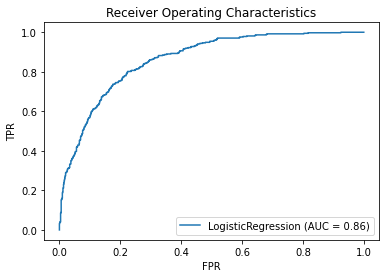

In [162]:
plot_roc_curve(lr,x_test,y_test)
plt.title('Receiver Operating Characteristics')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.show()

# I am getting AUC score of 86% with LogisticRegression

In [163]:
import joblib

In [164]:
joblib.dump(lr,'customer_churn_analysis.obj')

['customer_churn_analysis.obj']

In [166]:
joblib.load('customer_churn_analysis.obj')

LogisticRegression(random_state=54)